## Matrix Decomposition

In [3]:
# In numerical analysis, different decompositions are used to implement efficient matrix algorithms.Like SVD there are also a lot of other decomposition methods to implement

# Here we will use a matrix decomposition from linear algebra, the singular value decomposition , to generate a compressed approximation of an image. We will use the face image from the scipy.misc module

from scipy import misc
import matplotlib.pyplot as plt
%matplotlib inline

img = misc.face()

/tmp/ipykernel_10038/3206314403.py:9: DeprecationWarning: scipy.misc.face has been deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. Dataset methods have moved into the scipy.datasets module. Use scipy.datasets.face instead.
  img = misc.face()


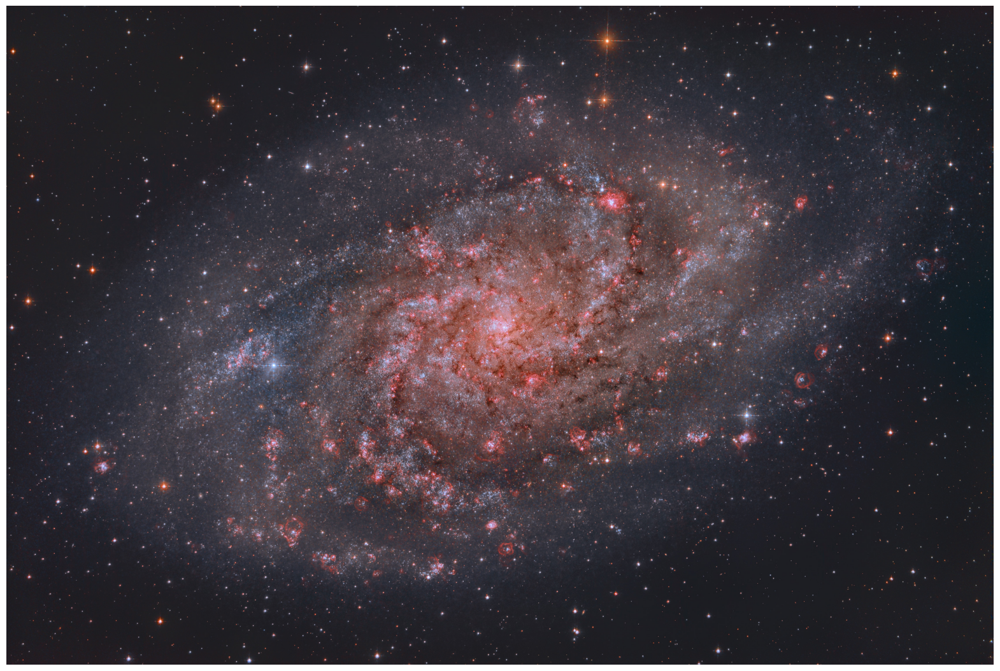

In [73]:
img = plt.imread('triangulum_hd.jpg')
plt.figure(figsize=(20,20))
plt.imshow(img)
plt.axis('off')
plt.show()

In [74]:
type(img)

numpy.ndarray

## Shape of the Image

In [75]:
# Note that, in linear algebra the dimension of a vector refers to the number of entries in an array. In NumPy, it instead defines the number of axis. For example, a 1D array is a vector such as [1,2,3] a 2D array is a matrix and so forth


# First, lets check for the shape of the data in our array. Since this image is two-dimensional, we might expect a two-dimensional array to represent it (a matrix).However using the shape property of this NumPy array gives us a different result

img.shape

(2313, 3462, 3)

In [76]:
# The output is a tuple with three elements, which means that this is a three dimensional array. In fact since is a color image, and we have used the imread function to read it, the dta is organized in three 2D arrays, representing color channels (in this case, red, green, and blue - RGB). You cna see this by looking at the shape above: it indicated that we have an array of 3 matrices each having shape 768x1024

img.ndim

3

In [77]:
# NumPy refers to each dimension as an axis. Because of how imread works, the first index in the 3rd axis is teh red pixel data for our image. We can access this by using the syntax

img[:,:,1].shape

(2313, 3462)

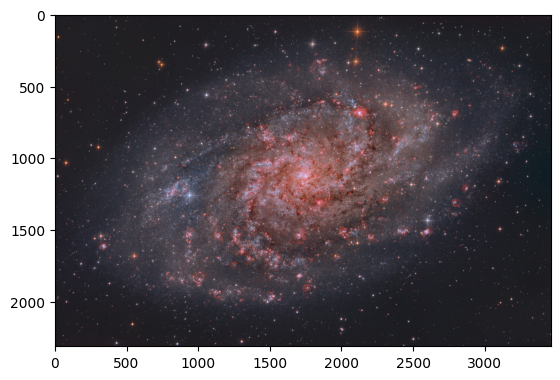

In [78]:
# Since we are going to perform linear algebra operations on this dta, it might be more interesting to have real numbers between 0 and 1 in each entry of the matrices to represnt the RGB values. We can do that by setting


# In other words we can say we are normalizing the data

img_array = img/255
plt.imshow(img_array)

# This operaion, dividing an array by a scalar, works because of numpy;s broadcasting rules.In real world applications it will be better to use, for example the img_as_float utility function from scikit-image

In [79]:
img_array.shape

(2313, 3462, 3)

In [80]:
img_array.max(), img_array.min()

(1.0, 0.0)

In [81]:
# Typechecking the data in the array:

img_array.dtype

dtype('float64')

In [82]:
# We can assign each color channel toa separate matrix using the slice syntax:

red_array = img_array[:,:,0]
green_array = img_array[:,:,1]
blue_array = img_array[:,:,2]

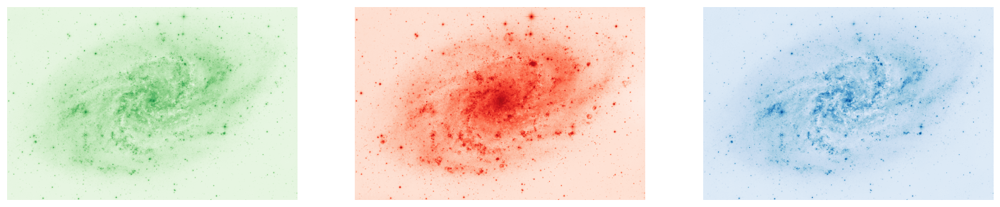

In [83]:
fig, ax = plt.subplots(1,3,figsize=(18,18))
ax[0].axis('off')
ax[1].axis('off')
ax[2].axis('off')
ax[0].imshow(green_array,cmap='Greens')
ax[1].imshow(red_array,cmap='Reds')
ax[2].imshow(blue_array,cmap='Blues')

## Operations on an axis

In [51]:
# It is possible to use methods from linear algebra to approximate an existing set of data. here we will use the SVD(Singular Value Decomposition) to try to rebuild an image that uses less singular value information than the original one, while still retaining some of its features.

# Here we will use numpy's linear algebra module, numpy.linalg to perform the operations in this tutorial. Most of the linear algebra functions in this module can also be found in scipy.linalg and users are encouraged to use the  scipy module for real world applications. However some functions in the scipy.linalg module, such as the SVD function, only support 2D arrays.

from numpy import linalg

# In order to extract information from a given matrix, we can use the SVD to obtain 3 arrays which can be multiplied to obtain the original matrix. 

# UEV**T = A, where the 1st and the 3rd are square(matrix) and E is the same size as A. E is a diagonal matrix and contains the singular values of A, organized from largest to smallest. These values are always non-negative and can be used as an indicator of the importance of some features represented by the matrix A

# According to colorimetry it is possible to obtain a fairly reasonable grayscale version of our color image if we apply the formula Y = 0.2126 R + 0.7152 G + 0.0722 B




(-0.5, 3461.5, 2312.5, -0.5)

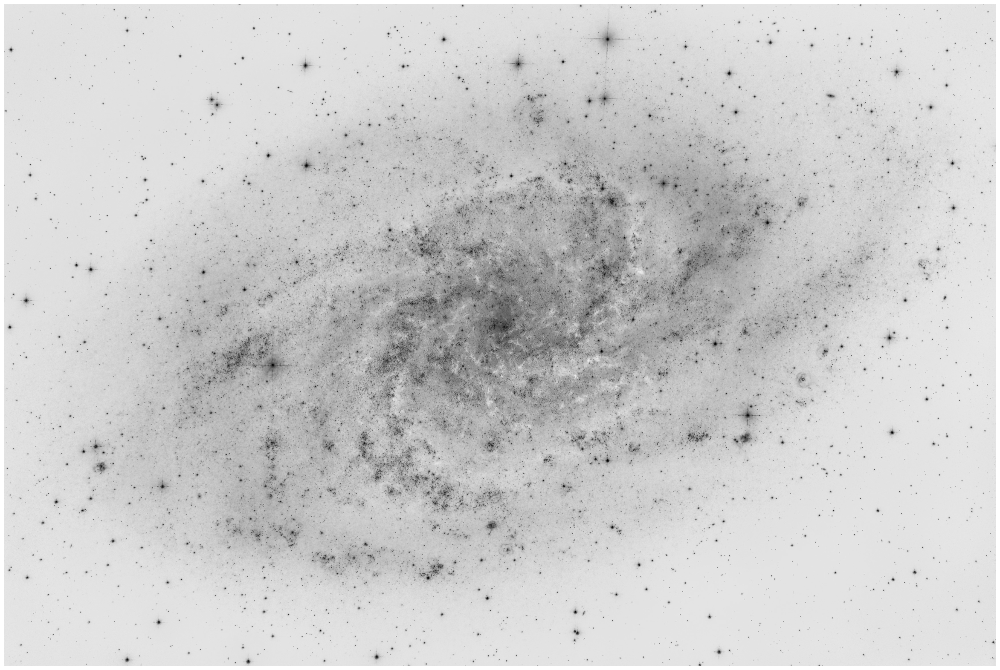

In [86]:
# now using the above knowledge we will perform matrix multiplications

img_gray = img_array@[0.2126, 0.7152, 0.0722]
plt.figure(figsize=(30,30))
plt.imshow(img_gray,cmap='gray_r')
plt.axis('off')


In [69]:
img_gray.shape

(684, 1024)

## Applying the SVD

In [107]:
U, s, Vt = linalg.svd(img_gray)

In [108]:
import numpy as np


In [109]:
U.shape, s.shape, Vt.shape

((2313, 2313), (2313,), (3462, 3462))

In [110]:
# Note that s has a particular shape: it ahs only one dimension . This means that some linear algebra functions that expect 2d arrays might not work. for example, form the theory, one might expect s and Vt to be compatible for multiplication. However this is not true as s does not have a second axis. Executing

'''s@Vt'''

's@Vt'

In [111]:
# this happens because having a one dimensional array for s, in this case is much more economic in practice than building a diagonal matrix with the same data.To reconstruct the original matrix, we can rebuild the diagonal matrix E with the elements of s in its diagonal and with the appropriate dimensions for multiplying in our cas, E should be 684x1024. In order to add the singular values to the diagonal of Sigma, we will use the fill_diagonal funciton form numpy


import numpy as np

Sigma = np.zeros((U.shape[1], Vt.shape[0]))
np.fill_diagonal(Sigma, s)

In [112]:
# If we reconstruct the 3 decomposed matrices we can see that we get the original gray_img

(-0.5, 3461.5, 2312.5, -0.5)

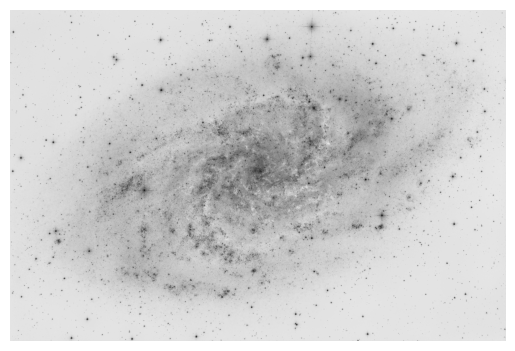

In [113]:
plt.imshow(U@Sigma@Vt, cmap='gray_r')
plt.axis('off')

## Approximation

In [114]:
# The linalg module includes a norm function ,which computes the norm of a vector or matrix represented in a numpy array. For example, from the SVD explanation above, we would expect the norm of the difference between img_gray and the reconstructed SVD product to be small. As expected, you should see something like


linalg.norm(img_gray - U@Sigma@Vt)

1.8481699808809845e-12

In [115]:
#We could also have used the numpy.allclose function to make sure the reconstructed product is, in fact close to or original matrix

np.allclose(img_gray, U@Sigma@Vt)

True

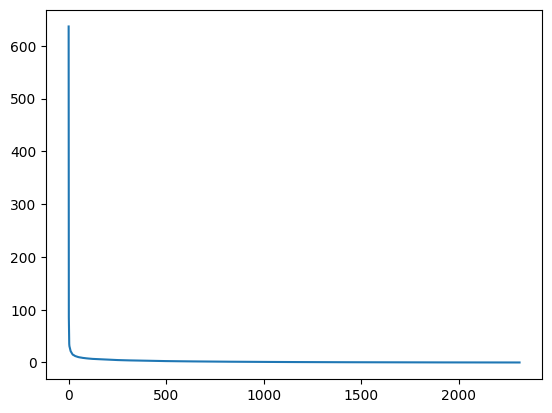

In [116]:
#(The actual result of this operation might be different depending on your architecture and linear algebra setup. Regardless you should see a small number.)


# To see if an approximation is reasonable, we can check the values in s

plt.plot(s)
plt.show()

In [122]:
# From the above graph we can see that although we have 768 singular values in s, most of those are pretty small. So it might make sense to use only the information related to the first say 250 singular values to build a more economical  approximation to our image


# The idea is to consider all but the first k singular values in Sigma (which are the smae as in s)d as zeros, keeping U and Vt intact, and coputing the product of these matrices as the approximation

# using the k to manipulate the value of sigma will enable us to lower the resolution of the image and manipulate it further
k=250
approx = U @ Sigma[:,:k] @ Vt[:k,:]

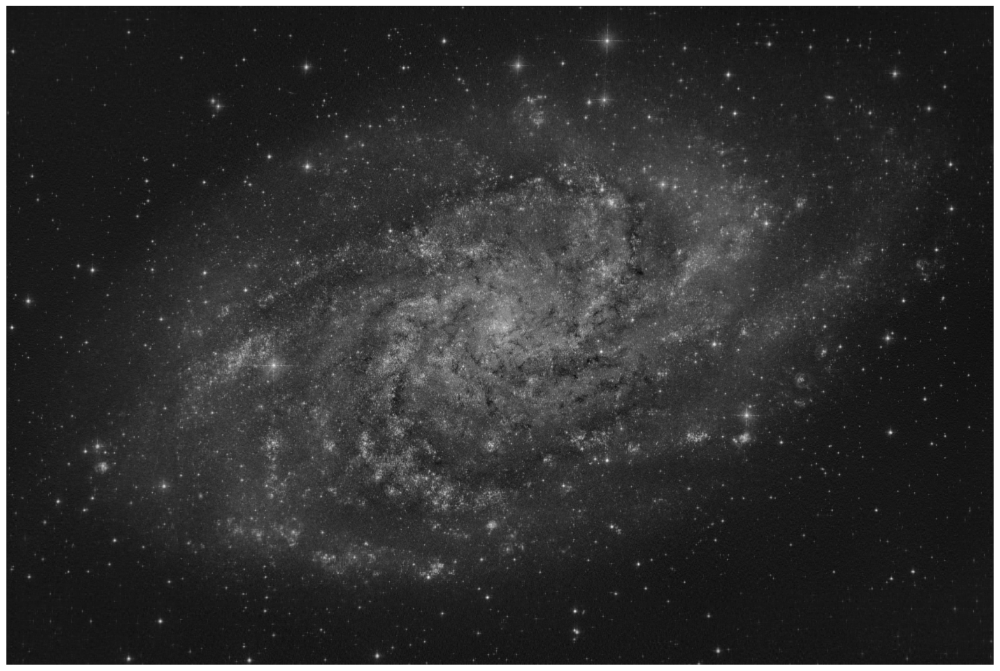

In [125]:
# Note that we had to use only the first k rows of Vt, since all other rows would be multiplied by the zeros corresponding to the singular values we eliminated from this approximation

plt.figure(figsize=(20,20))
plt.imshow(approx, cmap='gray')
plt.axis('off')
plt.show()

In [ ]:
# I have checked with the values of k starting from 250 and above and below, and found out that the value of k=250 makes the best tradeoffs between detail and imagesize. 

## Applying to all colors

In [126]:
# Now we want to do the same kind of operation, but to all three colors. Our first instict might be to repeat the same opeartion we did above to each color matrix individually. However, numpy's broadcasting takes care of this for us.


# If our array has more than two dimensions, then the SVD can be applied to all axes at once. However the linear algebra funcitons in numpy expect to see an array of the form (n x N x M) where the first axis n represents the number of MxN matrices in the stack.



img_array.shape

(2313, 3462, 3)

In [128]:
# so we need to permutate the axis on this array to get a shape like (3, 2313, 3462)
# Fortunately, the numpy.transpose function can do that for us:


'''np.transpose(x, axes=(i,j,k))'''

'np.transpose(x, axes=(i,j,k))'

In [131]:
# indicates that the axis will be reordered such that the final shape of the transposed array will be reordered according to the indices (i, j, k)


# Lets see how this goes for our array:


img_array_transposed = np.transpose(img_array, (2,0,1))
img_array_transposed.shape

(3, 2313, 3462)

In [132]:
# after the transformation we are ready to apply the SVD

U, s, Vt = linalg.svd(img_array_transposed)

In [133]:
# To obtain the full approximated image, we need to reassemble these matrices into the approximation , Now note that

U.shape, s.shape, Vt.shape

((3, 2313, 2313), (3, 2313), (3, 3462, 3462))

In [134]:
# Finally to build the final approximation matrix, we must understand how multiplication across different axes works

## Products with n-dimensional arrays

In [138]:
# If you have worked before with only one or two dimensional arrays in numpy, you might use np.dot and np.matmul interchangeably. However for n-dimesional arrays, they work in very different ways.


# Now, to build our approximation ,we first need to make suer that our singular values are ready for multiplication, so we build our Sigma matrix similarly to what we did before. The Sigma array must have dimensions (3, 3462, 3462).In order to add the singular values to the diagonal of Sigma, we will again use the fill_diagonal funciton , using each of the 3 rows in s as the diagonal for each of the 3 matrices in Sigma


Sigma = np.zeros((3, 2313, 3462))
for j in range(3):
    np.fill_diagonal(Sigma[j,:,:], s[j,:])

In [139]:
# Now, if we wish to rebuild the full SVD, we can do

reconstructed = U @ Sigma @ Vt

In [140]:
# The reconstructed image should be indistinguishable from teh origianl one, except for differences due to floating point errors from the reconstruction .Recall that our original image consisted of floating point values in the range [0,1]. The accumulation of floating point error from the reconstruction can result in values slightly outside this original range


reconstructed.min(), reconstructed.max()

(-9.501405738576718e-16, 1.000000000000007)

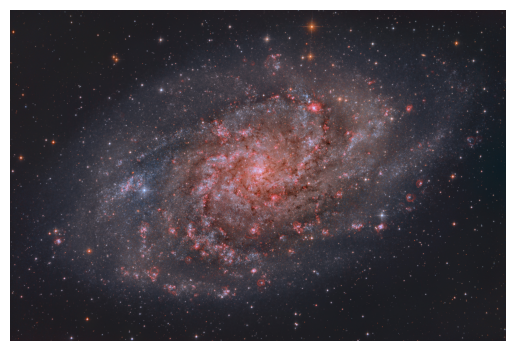

In [143]:
# Since imshow expects values in teh range, we can use clip to excise the floating point error

reconstructed = np.clip(reconstructed, 0, 1)
plt.imshow(np.transpose(reconstructed,(1,2,0)))
plt.axis('off')
plt.show()